In [1]:
%load_ext autoreload
%autoreload 2

# Simple representation space tests with a CNN

Genetic circuits can be designed with qualitative output behavior in mind. While the quantitative measurements relating to the circuits can be helpful, optimising for specific output values may be unfeasible because of the high dimensionality that genetic circuit space can embody. Furthermore, in many instances, a range of output values or those achieving a certain threshold are also ok. In this notebook, we will explore neural networks as a means for multi-purpose and multi-dimensional optimisation. We will use the embedding space as a way to find circuits that match a specific functional range.

## Imports

In [2]:
from typing import Optional, List, Callable, Dict, Any, Tuple, Union
from dataclasses import dataclass
import os

import haiku as hk
import jax
import jax.numpy as jnp
import numpy as np
import pandas as pd
import optax  # https://github.com/deepmind/optax
import torch  # https://pytorch.org
from jaxtyping import Array, Float, Int, PyTree  # https://github.com/google/jaxtyping
import ast

import equinox as eqx
import wandb

import seaborn as sns
import matplotlib.pyplot as plt

jax.config.update('jax_platform_name', 'gpu')

from synbio_morpher.utils.misc.numerical import make_symmetrical_matrix_from_sequence
from synbio_morpher.utils.misc.string_handling import convert_liststr_to_list
from synbio_morpher.utils.misc.type_handling import flatten_listlike
from synbio_morpher.utils.results.analytics.naming import get_true_names_analytics, get_true_interaction_cols

jax.devices()

I0000 00:00:1695830869.825017  466348 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.


[gpu(id=0)]

In [3]:

def cross_entropy_loss(x):
    return 1


def loss_func(x, y):
    return cross_entropy_loss(x)


def compute_grads(params, x, y, model):
    logits, outs = model.apply(params, None, x)
    return loss_func(logits, y), outs


def update(params, grads, lr=0.1):
    return jax.tree_util.tree_map(lambda p, g: p - g * lr, params, grads)


def train_step(params, x, y, model):
    params_grads, outs = jax.grad(compute_grads)(params, x, y, model)
    return update(params, params_grads), outs


def train(iterations: int, batchsize: int, params: jnp.ndarray, xdata: jnp.ndarray, ydata: jnp.ndarray, model, 
          save_params: Optional[jnp.ndarray] = None, save_outs: Optional[jnp.ndarray] = None):
    all_params = {}
    all_outs = {}
    for i in range(iterations):
        # for b in range(batchsize):
            # x = xdata[bi:bf]
        params, outs = train_step(params, xdata, ydata, model)
        if i in save_params:
            all_params[i] = save_params
        if i in save_outs:
            all_outs[i] = outs
    return params, outs

In [4]:
def calculate_conv_output(input_size: int, kernel_size: int, padding: int, stride: int):
    return int((input_size - kernel_size + 2 * padding) // stride + 1)

# Model setup and Training

Input: 3x3 interaction matrices

Output: Log10 of analytic, 10 possible spots

### Load data

In [6]:
# data_cfg = load_json_as_dict('../data/raw/parameter_based_simulation/2023_08_24_114212/experiment.json')
# param_range = create_parameter_range(data_cfg['config_params']['parameter_based_simulation'])
# og_data = np.load('../data/raw/parameter_based_simulation/2023_08_24_114212/sensitivity.npy')
# data = og_data[2]

# for i, s in enumerate(data.shape):
#     ii = 0
#     if np.prod(data.shape[:i]) > TOTAL_DS:
#         while np.prod(list(data.shape[:i-1]) + [ii]) < TOTAL_DS:
#             ii += 1
#         print(i-1, ii)
#         slices = [slice(data.shape[j]) for j in range(i-1)] + [slice(ii), 0]
#         print(data[tuple(slices)].shape)
#         break
    

# x_idxs = [slice(i) for i in data[tuple(slices)].shape] + [0] * ()

# x_idxs = [np.arange(i) for i in data[tuple(slices)].shape]
# param_range[x_idxs]
# y = data[tuple(slices)]


In [7]:
fn = '../data/processed/ensemble_mutation_effect_analysis/2023_07_17_105328/tabulated_mutation_info.csv'
data = pd.read_csv(fn)
data.drop(columns=['Unnamed: 0'], inplace=True)


Input of binding indexes. Using the same scheme as in the SANDSTORM model, where the number in the matrix corresponds to the number of bonds.

In [8]:
for c in get_true_interaction_cols(data, interaction_attr='binding_sites_idxs', remove_symmetrical=True) + get_true_interaction_cols(
        data, interaction_attr='binding_site_group_range', remove_symmetrical=True):
    data[c] = data[c].map(ast.literal_eval)

### 2D Input

In [9]:
nucs_RNA = ['A', 'C', 'G', 'U']
binding_value_map = list(set([tuple(t) for t in flatten_listlike([[(sorted((i, j))) for i in nucs_RNA] for j in nucs_RNA])]))
binding_value_map = dict(zip(binding_value_map, np.ones(len(binding_value_map))))
binding_value_map[('A', 'U')] = 2
binding_value_map[('C', 'G')] = 3

Correct the 1-indexing into 0-indexing for the `binding_sites_idxs`.

In [10]:
for c in get_true_interaction_cols(data, 'binding_sites_idxs', remove_symmetrical=True):
    data[c] = data[c].apply(lambda x: jax.tree_util.tree_map(lambda xx: xx - 1, x))

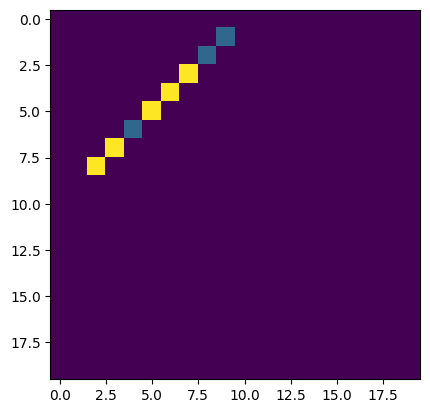

In [11]:
def construct_binding_img(binding_idxs: list, seq_length: int):
    img = np.zeros((seq_length, seq_length))
    for i, j in binding_idxs:
        img[i, j] = 1
    return img


def construct_binding_img_complex(binding_idxs: list, seq_length: int, sequence_q, sequence_t):
    """ Warning: sequence q (query) would be the first strand by ordinal number, but would actually be
    the bottom strand in the IntaRNA simulator. Conversely, sequence t (target) is the sequence displayed
    on the top. Here is an example: 

    query: CGGCGGUCGAAGAAUUCCCG target: CACGGCCGUUAUAUCACGUG
                3      10
                |      |
            5'-CA        AUAU...GUG-3'
                CGGCCGUU
                ++++++++
                GCUGGCGG
    3'-GCC...AGAA        C-5'
                |      |
                9      2


    The binding indices in the column `binding_sites_idxs`
    are a tuple where the first number is the index along the top strand and the second (decreasing) 
    number in the tuple set is the index along the bottom strand. """
    img = np.zeros((seq_length, seq_length))

    for t, q in binding_idxs:
        img[q, t] = binding_value_map[tuple(
            sorted((sequence_q[q], sequence_t[t])))]
    return img


i = construct_binding_img_complex(
    data[get_true_interaction_cols(
        data, 'binding_sites_idxs', remove_symmetrical=True)[1]].iloc[0],
    seq_length=len(data['sample_seq'].iloc[0]),
    sequence_q=data['sample_seq'].iloc[0],
    sequence_t=data['sample_seq'].iloc[1])

plt.imshow(i)

## Models


### Patrick's Equinox CNN

In [12]:
class CNN(eqx.Module):
    layers: list

    def __init__(self, key, n_channels: int, out_channels: int, n_head: int,
                 kernel_size: int = 3, in_dim1: int = 3,
                 max_pool_kernel_size: int = 2):
        key1, key2, key3, key4 = jax.random.split(key, 4)
        # Standard CNN setup: convolutional layer, followed by flattening,
        # with a small MLP on top.

        # [(W−K+2P)/S]+1
        # 1D
        # conv_out = (out_channels - 1 * (kernel_size - 1) - 1) // 1 + 1
        # 2D
        # conv_out = (in_dim1 - kernel_size + 2 * 0) // 1 + 1
        out1 = calculate_conv_output(in_dim1, kernel_size, padding=0, stride=1)
        out2 = calculate_conv_output(out1, max_pool_kernel_size, padding=0, stride=1)

        self.layers = [
            eqx.nn.Conv2d(in_channels=n_channels, out_channels=out_channels,
                          kernel_size=kernel_size, key=key1),
            eqx.nn.MaxPool2d(kernel_size=max_pool_kernel_size, stride=1),
            jax.nn.relu,
            jnp.ravel,
            eqx.nn.Linear(np.power(out2, 2) * out_channels, 
                          np.power(out2, 2) * out_channels * 4, key=key2),
            jax.nn.sigmoid,
            eqx.nn.Linear(np.power(out2, 2) * out_channels * 4,
                          np.power(out2, 2) * out_channels, key=key3),
            jax.nn.relu,
            # eqx.nn.Dropout(p=0.4),
            eqx.nn.Linear(np.power(out2, 2) * out_channels, n_head, key=key4),
            jax.nn.log_softmax
        ]

    def __call__(self, x: Float[Array, "1 28 28"], inference: bool = False) -> Float[Array, "10"]:
        for i, layer in enumerate(self.layers):
            kwargs = {} if not type(layer) == eqx.nn.Dropout else {
                'inference': inference, 'key': jax.random.PRNGKey(0)}

            x = layer(x, **kwargs)
            
            # wandb.log({f'emb_{i}_{type(layer)}': x})
        return x

### FCN

In [131]:
class FCN(eqx.Module):
    layers: list

    def __init__(self, key, in_expected: int, layer_sizes: List[int], n_head: int):
        
        self.layers = self.create_layers(in_expected, layer_sizes, n_head, key)
        
        
    def create_layers(self, in_expected: int, layer_sizes: List[int], n_head: int, key):
        sizes = [in_expected] + layer_sizes + [n_head]
        key, *subkeys = jax.random.split(key, len(sizes))
        l = []
        for i, (si, sj, subkey) in enumerate(zip(sizes[:-1], sizes[1:], subkeys)):
            if l:
                l.append(jax.nn.relu)
                if np.mod(i, 2) == 0:
                    l.append(jax.nn.sigmoid)
            # if sj == n_head:
            #     l.append(eqx.nn.Dropout(p=0.4))
            l.append(
                eqx.nn.Linear(si, sj, key=subkey)
            )
        l.append(jax.nn.log_softmax)
        return l
        

    def __call__(self, x: Float[Array, " num_interactions"], inference: bool = False, seed: int = 0) -> Float[Array, " n_head"]:
        for i, layer in enumerate(self.layers):
            kwargs = {} if not type(layer) == eqx.nn.Dropout else {
                'inference': inference, 'key': jax.random.PRNGKey(seed)}

            x = layer(x, **kwargs)
            
            # wandb.log({f'emb_{i}_{type(layer)}': x})
        return x

### Hyperparams

In [159]:
BATCH_SIZE = 64
N_BATCHES = 8000
TRAIN_SPLIT = int(0.8 * N_BATCHES)
TEST_SPLIT = N_BATCHES - TRAIN_SPLIT
LEARNING_RATE = 1e-5
STEPS = 5000
PRINT_EVERY = 200
SEED = 0
TOTAL_DS = BATCH_SIZE * N_BATCHES
INPUT_SPECIES = 'RNA_1'

# CNN Architecture
N_CHANNELS = 1
OUT_CHANNELS = 3
KERNEL_SIZE = 1
MAX_POOL_KERNEL_SIZE = 1

# FCN Architecture
LAYER_SIZES = [10, 20, 50, 50, 50, 50]


n_samples = len(data['sample_name'].unique())

key = jax.random.PRNGKey(SEED)
key, subkey = jax.random.split(key, 2)

# wandb.init(
#     # set the wandb project where this run will be logged
#     project="my-awesome-project",
#     # track hyperparameters and run metadata
#     config={
#     "learning_rate": LEARNING_RATE,
#     "architecture": "CNN",
#     "dataset": "MNIST",
#     "epochs": STEPS,
#     }
# )

### Define input

In [160]:
def convert_to_scientific_exponent(x): 
    return int(f'{x:.0e}'.split('e')[1])

vectorized_convert_to_scientific_exponent = np.vectorize(convert_to_scientific_exponent)
filt = data['sample_name'] == INPUT_SPECIES

x = data[filt][get_true_interaction_cols(data, 'binding_rates_dissociation', remove_symmetrical=True)].iloc[:TOTAL_DS].values
x = jax.tree_util.tree_map(vectorized_convert_to_scientific_exponent, x)
x = jax.random.permutation(key, x, axis=0, independent=True)

# Make binding into 2D Interactions
# x = np.expand_dims(np.array([make_symmetrical_matrix_from_sequence(xx, n_samples) for xx in x]), axis=1)

y = data[filt]['sensitivity'].iloc[:TOTAL_DS].to_numpy()
y = jax.tree_util.tree_map(vectorized_convert_to_scientific_exponent, y)[None, :]
y = jax.random.permutation(key, y, axis=0, independent=True)

N_HEAD = len(np.unique(y))


if x.shape[0] < TOTAL_DS:
    print(f'WARNING: The filtered data is not as large as the requested total dataset size: {x.shape[0]} vs. requested {TOTAL_DS}')

In [161]:
# ymin = data['sensitivity'].iloc[:TOTAL_DS].min()
# ymax = data['sensitivity'].iloc[:TOTAL_DS].max()
# y = np.interp(data['sensitivity'].iloc[:TOTAL_DS].to_numpy(), [ymin, ymax], [0, n_head - 1])[None, :]



In [162]:
# ps = np.array([1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2])
# n_species = 3
# n_head = 10
# channels = ['sensitivity', 'precision', 'overshoot']
# N_SPLIT = 10
# TOTAL_DS = BATCH_SIZE * N_SPLIT
# idxs_x = [np.array([int(xx) for xx in str(x)])
#           for x in np.random.randint(low=100000, high=999999, size=TOTAL_DS)]
# idxs_y = [np.array([int(xx) for xx in str(x)])
#           for x in np.random.randint(low=1, high=9, size=TOTAL_DS)]
# dummy_x = ps[idxs_x][:, None, :]
# # dummy_x = np.concatenate([make_symmetrical_matrix_from_sequence(
# #     i, side_length=n_species)[None, None, :, :] for i in ps[idxs_x]])
# dummy_y = np.arange(len(ps))[idxs_y]


# testloader = [(dummy_x[BATCH_SIZE*n:BATCH_SIZE*(n+1)].astype(jnp.float32),
#                dummy_y[BATCH_SIZE*n:BATCH_SIZE*(n+1)].astype(jnp.int32)) for n in range(0, N_SPLIT//3)]

# trainloader = [(dummy_x[BATCH_SIZE*n:BATCH_SIZE*(n+1)].astype(jnp.float32),
#                 dummy_y[BATCH_SIZE*n:BATCH_SIZE*(n+1)].astype(jnp.int32)) for n in range(N_SPLIT//3, N_SPLIT)]

In [163]:
# dummy_x = np.random.rand(np.prod([BATCH_SIZE, n_channels, dimx, dimx])).reshape(
#     BATCH_SIZE, n_channels, dimx, dimx).astype(jnp.float32)
# dummy_y = np.random.choice(
#     np.arange(n_head-1), BATCH_SIZE).reshape(BATCH_SIZE).astype(jnp.int32)
# print(dummy_x.shape)  # 64x1x28x28
# print(dummy_y.shape)  # 64
# print(dummy_y)

# n_test_samples = 3
# testloader = [(np.random.rand(np.prod([BATCH_SIZE, n_channels, dimx, dimx])).reshape(BATCH_SIZE, n_channels, dimx, dimx).astype(
#     jnp.float32), np.random.choice(np.arange(n_head-1), BATCH_SIZE).reshape(BATCH_SIZE).astype(jnp.int32)) for n in range(n_test_samples)]

# n_train_samples = 30
# trainloader = [(np.random.rand(np.prod([BATCH_SIZE, n_channels, dimx, dimx])).reshape(BATCH_SIZE, n_channels, dimx, dimx).astype(
#     jnp.float32), np.random.choice(np.arange(n_head-1), BATCH_SIZE).reshape(BATCH_SIZE).astype(jnp.int32)) for n in range(n_test_samples)]


In [164]:
# # Checking our data a bit (by now, everyone knows what the MNIST dataset looks like)
# dummy_x, dummy_y = next(iter(trainloader))
# dummy_x = dummy_x.numpy()
# dummy_y = dummy_y.numpy()
# print(dummy_x.shape)  # 64x1x28x28
# print(dummy_y.shape)  # 64
# print(dummy_y)

#### Mini-test

In [166]:
# model = CNN(subkey, n_channels=N_CHANNELS, out_channels=OUT_CHANNELS, n_head=N_HEAD, kernel_size=KERNEL_SIZE, max_pool_kernel_size=MAX_POOL_KERNEL_SIZE)

model = FCN(subkey, in_expected=x.shape[1], layer_sizes=LAYER_SIZES, n_head=N_HEAD)


In [167]:
def loss(
    model: Union[CNN, FCN], x: Float[Array, "batch 1 28 28"], y: Int[Array, " batch"]
) -> Float[Array, ""]:
    # Our input has the shape (BATCH_SIZE, 1, 28, 28), but our model operations on
    # a single input input image of shape (1, 28, 28).
    #
    # Therefore, we have to use jax.vmap, which in this case maps our model over the
    # leading (batch) axis.
    pred_y = jax.vmap(model)(x)
    return cross_entropy(y, pred_y)


def cross_entropy(
    y: Int[Array, " batch"], pred_y: Float[Array, "batch 10"]
) -> Float[Array, ""]:
    # y are the true targets, and should be integers 0-9.
    # pred_y are the log-softmax'd predictions.
    pred_y = jnp.take_along_axis(pred_y, y, axis=1)
    # pred_y = jnp.take_along_axis(pred_y, y, axis=1)
    return -jnp.mean(pred_y)


# Example loss
loss_value = loss(model, x[:10], y[:10])
print(loss_value.shape)  # scalar loss
# Example inference
output = jax.vmap(model)(x[:10])
print(output.shape)  # batch of predictions

()
(10, 7)


In [168]:
# This will work!
params, static = eqx.partition(model, eqx.is_array)


def loss2(params, static, x, y):
    model = eqx.combine(params, static)
    return loss(model, x, y)


loss_value, grads = jax.value_and_grad(loss2)(params, static, x[:5], y[:5])
print(loss_value)

1.9952571


### Evaluation

In [169]:
loss = eqx.filter_jit(loss)  # JIT our loss function from earlier!


@eqx.filter_jit
def compute_accuracy(
    model: CNN, x: Float[Array, "batch num_interactions"], y: Int[Array, " batch n_head"]
) -> Float[Array, ""]:
    """This function takes as input the current model
    and computes the average accuracy on a batch.
    """
    pred_y = jax.vmap(model)(x)
    pred_y = -1 * jnp.argmax(pred_y, axis=1)
    return jnp.mean(y == pred_y)

def evaluate(model: CNN, testloader: torch.utils.data.DataLoader):
    """This function evaluates the model on the test dataset,
    computing both the average loss and the average accuracy.
    """
    avg_loss = 0
    avg_acc = 0
    for x, y in testloader:
        # Note that all the JAX operations happen inside `loss` and `compute_accuracy`,
        # and both have JIT wrappers, so this is fast.
        avg_loss += loss(model, x, y)
        avg_acc += compute_accuracy(model, x, y)
    return avg_loss / len(testloader), avg_acc / len(testloader)


combined_data = list(zip(x.reshape(*[N_BATCHES, BATCH_SIZE] + list(x.shape[1:])), y.reshape(N_BATCHES, BATCH_SIZE, 1)))
evaluate(model, combined_data)

(Array(1.995225, dtype=float32), Array(0.03618555, dtype=float32))

### Training

In [170]:
optim = optax.adamw(LEARNING_RATE)

In [171]:
def train(
    model: CNN,
    trainset: torch.utils.data.DataLoader,
    testset: torch.utils.data.DataLoader,
    optim: optax.GradientTransformation,
    steps: int,
    print_every: int,
) -> CNN:
    # Just like earlier: It only makes sense to train the arrays in our model,
    # so filter out everything else.
    opt_state = optim.init(eqx.filter(model, eqx.is_array))

    # Always wrap everything -- computing gradients, running the optimiser, updating
    # the model -- into a single JIT region. This ensures things run as fast as
    # possible.
    @eqx.filter_jit
    def make_step(
        model: CNN,
        opt_state: PyTree,
        x: Float[Array, "batch 1 28 28"],
        y: Int[Array, " batch"],
    ):
        loss_value, grads = eqx.filter_value_and_grad(loss)(model, x, y)
        updates, opt_state = optim.update(grads, opt_state, model)
        model = eqx.apply_updates(model, updates)
        return model, opt_state, loss_value

    saves = {}
    # for step, (x, y) in zip(range(steps), infinite_trainloader()):
    for step, (x, y) in zip(range(steps), trainset):
        # PyTorch dataloaders give PyTorch tensors by default,
        # so convert them to NumPy arrays.
        # x = x.numpy()
        # y = y.numpy()
        model, opt_state, train_loss = make_step(model, opt_state, x, y)
        if (step % print_every) == 0 or (step == steps - 1):
            test_loss, test_accuracy = evaluate(model, testset)
            print(
                f"{step=}, train_loss={train_loss.item()}, "
                f"test_loss={test_loss.item()}, test_accuracy={test_accuracy.item()}"
            )
            saves[step] = {
                'opt_state': opt_state,
                'train_loss': train_loss,
                'test_loss': test_loss,
                'test_accuracy': test_accuracy
            }
    return model, saves

In [172]:
train_data = list(zip(x.reshape(*[N_BATCHES, BATCH_SIZE] + list(x.shape[1:]))[:TRAIN_SPLIT], y.reshape(N_BATCHES, BATCH_SIZE, 1)[:TRAIN_SPLIT]))
test_data = list(zip(x.reshape(*[N_BATCHES, BATCH_SIZE] + list(x.shape[1:]))[TEST_SPLIT:], y.reshape(N_BATCHES, BATCH_SIZE, 1)[TEST_SPLIT:]))
# train_data = list(zip(combined_data[0][:TRAIN_SPLIT], combined_data[1][:TRAIN_SPLIT]))
# test_data = list(zip(combined_data[0][:TEST_SPLIT], combined_data[1][:TEST_SPLIT]))

In [173]:
model, saves = train(model, train_data, test_data, optim, STEPS, PRINT_EVERY)

step=0, train_loss=1.9468852281570435, test_loss=1.993701696395874, test_accuracy=0.03833251819014549
step=200, train_loss=1.9185748100280762, test_loss=1.9111467599868774, test_accuracy=0.03833251819014549
step=400, train_loss=1.8206626176834106, test_loss=1.8331561088562012, test_accuracy=0.03833251819014549
step=600, train_loss=1.8011906147003174, test_loss=1.7550007104873657, test_accuracy=0.03833251819014549
step=800, train_loss=1.644669532775879, test_loss=1.6818716526031494, test_accuracy=0.029484862461686134
step=1000, train_loss=1.5415871143341064, test_loss=1.6047766208648682, test_accuracy=0.029484862461686134
step=1200, train_loss=1.5157060623168945, test_loss=1.5269590616226196, test_accuracy=0.029484862461686134
step=1400, train_loss=1.3729896545410156, test_loss=1.4525007009506226, test_accuracy=0.029484862461686134
step=1600, train_loss=2.0256099700927734, test_loss=1.38120698928833, test_accuracy=0.029484862461686134
step=1800, train_loss=1.2070691585540771, test_loss=

Text(0.5, 0, 'step')

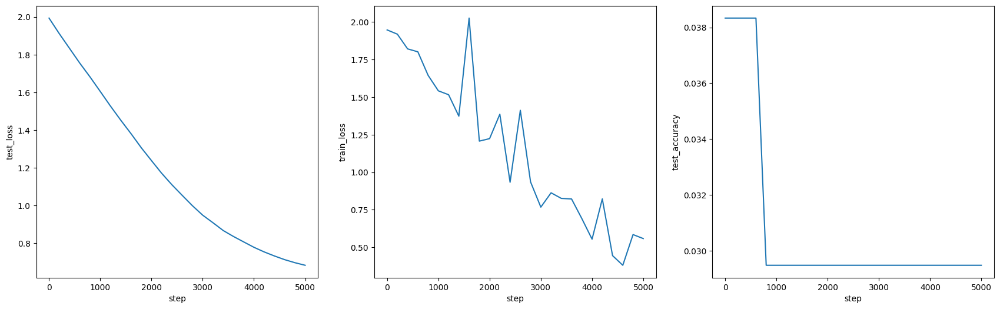

In [174]:
plt.figure(figsize=(7*3, 6))
ax = plt.subplot(1,3,1)
plt.plot(list(saves.keys()), [v['test_loss'] for v in saves.values()])
plt.ylabel('test_loss')
plt.xlabel('step')
ax = plt.subplot(1,3,2)
plt.plot(list(saves.keys()), [v['train_loss'] for v in saves.values()])
plt.ylabel('train_loss')
plt.xlabel('step')
ax = plt.subplot(1,3,3)
plt.plot(list(saves.keys()), [v['test_accuracy'] for v in saves.values()])
plt.ylabel('test_accuracy')
plt.xlabel('step')

### Visualise

In [147]:
# def testload():
#     yield from testloader
    
# xy = [(np.array(x), np.array(y)) for x, y in testload()]
# X_test = np.concatenate([x for x, y in xy])
# Y_test = np.concatenate([y for x, y in xy])

In [148]:
# cols = flatten_listlike([[f'pixel_{i}_{j}' for i in range(X_test.shape[-1])] for j in range(X_test.shape[-2])])
# df1 = pd.DataFrame(data=X_test.reshape(X_test.shape[0], np.prod(X_test.shape[1:])), columns=cols)
# df1['target'] = Y_test
# df1['target'] = df1['target'].apply(str)
# df1['image'] = df1.apply(lambda row: wandb.Image(row[:-1].values.reshape(X_test.shape[-2], X_test.shape[-1])), axis=1)
# df1 = df1[df1.columns.tolist()[-2:] + df1.columns.tolist()[:-2]]


In [149]:
# wandb.init(project="embedding_tutorial")
# wandb.log({"digits": df1})
# wandb.finish()

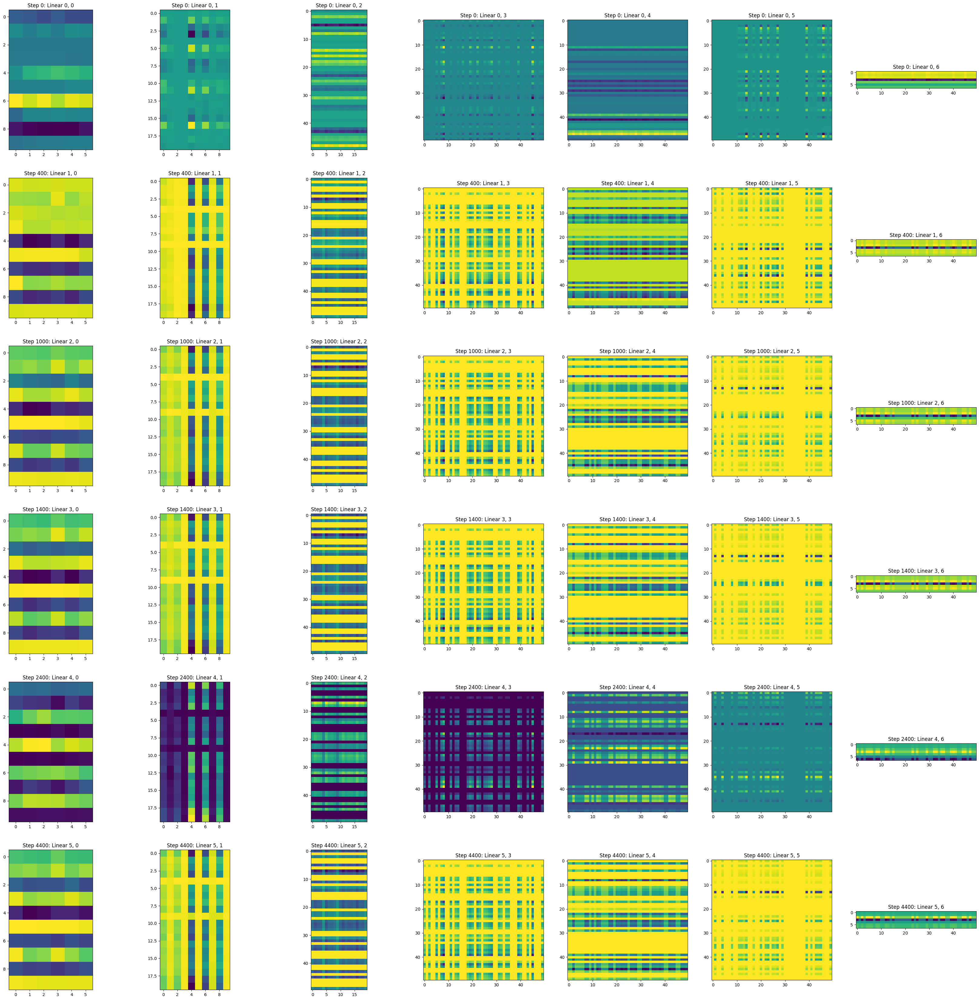

In [150]:
steps_chosen = np.floor(np.array([0, 0.1, 0.2, 0.3, 0.5, 0.9]) * STEPS).astype(int)
steps_chosen = steps_chosen - np.mod(steps_chosen, PRINT_EVERY)
l = {s: [ll for ll in saves[s]['opt_state'][0].mu.layers if (ll is not None) and hasattr(ll, 'weight')] for s in steps_chosen}

plt.figure(figsize=(7*len(l), 6 * len(l[0])))
for si, (s, ls) in enumerate(l.items()):
    for li, ll in enumerate(ls):
        axis_i = np.arange(1, len(ls) * len(l) + 1).reshape(len(l), len(ls))
        ax = plt.subplot(len(l), len(ls), axis_i[si, li])
        
        w = ll.weight if ll.weight.ndim == 2 else ll.weight[:, :, 0, 0]
        # w = ll.bias if ll.bias.ndim == 2 else ll.bias[None, :]
        plt.imshow(w)
        plt.title(f'Step {s}: ' + str(ll).split('(')[0] + f' {si}, {li}')


In [151]:
stop

NameError: name 'stop' is not defined

# Haiku simple model

In [ ]:
channels = ['sensitivity', 'precision', 'overshoot'] #, 'fold_change', 'response_time', 'initial_steady_states', 'final_steady_states']
n_species = 3
species = [f'RNA_{n}' for n in range(n_species)]

@dataclass
class SimpleConfig():
    
    decoder_num_layers: int
    encoder_num_layers: int
    decoder_blocksize: int
    encoder_blocksize: int
    
    embed_dims: int
    vocab_size: int
    
    kernel_shape: Tuple
    output_channels: int
    
    head_output_size: int
    
    encoder_layers_to_save: List[int]

In [ ]:
class SimpleModel(hk.Module):

    def __init__(
        self,
        config: SimpleConfig,
        name: Optional[str] = None
    ) -> None:
        super().__init__(name=name)

        self._config = config

    def _encoding_block(self, layer_idx: int, block_idx: int) -> Callable:

        def call(x):
            # for block_idx in range(self._config.encoder_blocksize):
            x = hk.Conv2D(
                output_channels=self._config.output_channels,
                kernel_shape=self._config.kernel_shape,
                name=f'conv2d_{layer_idx}_{block_idx}')(x)
            # x = hk.Linear(output_size=self._config.output_size,
            #               name=f'linear_enc_{layer_idx}_{block_idx}')(x)
            x = jax.nn.relu(x)
            return x

        return call

    def encoder(
        self,
        x,
        outs: Dict[str, Any]
    ):

        layers: List[Callable] = flatten_listlike([[
            self._encoding_block(layer_idx, block_idx)
            for block_idx in range(self._config.encoder_blocksize)]
            for layer_idx in range(self._config.encoder_num_layers)
        ])

        for layer_idx, layer in enumerate(layers):
            x = layer(
                x=x
            )
            # if (layer_idx + 1) in self._config.encoder_layers_to_save:
            outs[f"embeddings_enc_{(layer_idx+1)}"] = x  # output["embeddings"]

        return x, outs

    def _decoding_block(self, layer_idx: int) -> Callable:

        def call(x):
            for block_idx in range(self._config.encoder_blocksize):
                x = hk.Linear(output_size=self._config.head_output_size,
                              name=f'linear_dec_{layer_idx}_{block_idx}')(x)
                x = jax.nn.relu(x)
            return x

        return call

    def decoder(
        self,
        x,
        outs: Dict[str, Any]
    ):

        layers: List[Callable] = [
            self._decoding_block(layer_idx)
            for layer_idx in range(self._config.decoder_num_layers)
        ]

        for layer_idx, layer in enumerate(layers):
            x = layer(x)
            if (layer_idx + 1) in self._config.encoder_layers_to_save:
                # output["embeddings"]
                outs[f"embeddings_dec_{(layer_idx+1)}"] = x

        return x, outs

    def head(self, x, outs):
        x = hk.LayerNorm(
            axis=-1, create_scale=True, create_offset=True, name="emb_layer_norm_after"
        )(x)
        # Embeddings are computed after the first layer norm to be consistent with ESM
        embeddings = x
        x = hk.Linear(self._config.embed_dims, name="head_fc_1")(x)
        x = jax.nn.gelu(x, approximate=False)
        x = hk.LayerNorm(
            axis=-1, create_scale=True, create_offset=True, name="head_layer_norm"
        )(x)

        # Compute logits
        logits = hk.Linear(self._config.head_output_size,
                           name="head_final_fc")(x)
        outs['embeddings_final'] = embeddings
        outs['logits'] = logits
        return logits, outs

    def embedding(self, x):
        x = hk.Flatten(
            preserve_dims=1, name="flatten"
        )(x)
        return x

    def __call__(self, x, *args, **kwargs) -> dict:

        outs = {}
        x, outs = self.encoder(x, outs)
        emb = self.embedding(x)
        y, outs = self.decoder(emb, outs)
        
        y, outs = self.head(y, outs)

        return y, outs

## Train

In [ ]:
config = SimpleConfig(
    decoder_num_layers=2,
    encoder_num_layers=2,
    decoder_blocksize=2,
    encoder_blocksize=2,
    
    embed_dims=64,
    vocab_size=128,

    kernel_shape=(2,2),
    output_channels=3,
    head_output_size=9,
    
    encoder_layers_to_save=[1, 2]
)

def forward_fn(x):
    model = SimpleModel(config, name='simple_model')
    return model(x)

t_forward_fn = hk.transform(forward_fn)

In [ ]:
x = jnp.arange(9).reshape((3,3)).astype(jnp.float32)
xs = jnp.repeat(x[None, :, :], repeats=6, axis=0).astype(jnp.float32)
ys = jnp.repeat(jnp.arange(9)[None, :], repeats=6, axis=0).astype(jnp.float32)

rng = hk.PRNGSequence(jax.random.PRNGKey(42))
params = t_forward_fn.init(next(rng), xs)
# logits = t_forward_fn.apply(params, next(rng), xs)

In [ ]:
iterations = 5

xtrain = train(
    iterations=iterations,
    batchsize=1,
    params=params,
    xdata=xs,
    ydata=ys,
    model=t_forward_fn,
    save_params=np.arange(iterations),
    save_outs=np.arange(iterations)
)

In [ ]:
stop

NameError: name 'stop' is not defined

## Expectations from data

In [153]:
# data['mutation_type'] = convert_liststr_to_list(data['mutation_type'].str)
# data['mutation_positions'] = convert_liststr_to_list(data['mutation_positions'].str)

for c in ['mutation_type', 'mutation_positions']:
    data[c] = data[c].map(ast.literal_eval)

In [154]:
analytics_types = get_true_names_analytics(list(data.columns))

In [155]:
analytics_types

['fold_change',
 'initial_steady_states',
 'max_amount',
 'min_amount',
 'overshoot',
 'RMSE',
 'steady_states',
 'response_time',
 'response_time_diff_to_base_circuit',
 'response_time_ratio_from_mutation_to_base',
 'precision',
 'precision_diff_to_base_circuit',
 'precision_ratio_from_mutation_to_base',
 'sensitivity',
 'sensitivity_diff_to_base_circuit',
 'sensitivity_ratio_from_mutation_to_base',
 'fold_change_diff_to_base_circuit',
 'initial_steady_states_diff_to_base_circuit',
 'max_amount_diff_to_base_circuit',
 'min_amount_diff_to_base_circuit',
 'overshoot_diff_to_base_circuit',
 'RMSE_diff_to_base_circuit',
 'steady_states_diff_to_base_circuit',
 'fold_change_ratio_from_mutation_to_base',
 'initial_steady_states_ratio_from_mutation_to_base',
 'max_amount_ratio_from_mutation_to_base',
 'min_amount_ratio_from_mutation_to_base',
 'overshoot_ratio_from_mutation_to_base',
 'RMSE_ratio_from_mutation_to_base',
 'steady_states_ratio_from_mutation_to_base']

In [156]:
analytics_types = ['fold_change',
 'initial_steady_states',
 'max_amount',
 'min_amount',
 'overshoot',
 'RMSE',
 'steady_states',
 'response_time',
 'response_time_ratio_from_mutation_to_base',
 'precision',
 'precision_ratio_from_mutation_to_base',
 'sensitivity',
 'sensitivity_ratio_from_mutation_to_base',
 'fold_change_ratio_from_mutation_to_base',
 'initial_steady_states_ratio_from_mutation_to_base',
 'max_amount_ratio_from_mutation_to_base',
 'min_amount_ratio_from_mutation_to_base',
 'overshoot_ratio_from_mutation_to_base',
 'steady_states_ratio_from_mutation_to_base']

In [175]:
plt.figure(figsize=(6*len(analytics_types), 5*len(analytics_types)))
for q, ai in enumerate(analytics_types):
    for t, aj in enumerate(analytics_types[q:]):
        if ai == aj:
            continue
        axis_i = np.arange(1, len(analytics_types) * len(analytics_types) + 1).reshape(len(analytics_types), len(analytics_types))
        ax = plt.subplot(len(analytics_types), len(analytics_types), axis_i[q, t])
        sns.scatterplot(data, x=ai, y=aj, alpha=0.1, hue='sample_name')
        if np.sum([a in ai for a in ['sensitivity', 'precision']]):
            plt.xscale('log')
        if np.sum([a in aj for a in ['sensitivity', 'precision']]):
            plt.yscale('log')

/home/wadh6511/Kode/env_evo/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_evo/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)
